## Aplicación de Redes Siamesas a un problema de Clasificación de Orador

##### Matías Di Bernardo y Federico Ferreyra

La idea de este notebook es aplicar la estructura de la red siamesa vista en clase a un problema de Speaker Diarizarion el cual consiste en identificar distintos oradores dentro de un audio. El objetivo es que la red aprenda a identificar la diferencia entre distintos oradores al realizar una extracción de caraterísticas del fragmento de audio de cada orador y comparar la similitud al evaluar la distnacia euclidiana entre los vectores de características. Primero es importan todas las librerias que se van a utilizar. 

In [50]:
from tensorflow.keras.models       import Model, load_model
from keras.layers       import Input, Lambda, Dense, Conv2D, Flatten, MaxPooling2D, Concatenate
from keras.layers       import Dropout, BatchNormalization, GaussianNoise
from tensorflow.keras.optimizers   import Adam
from keras.constraints  import unit_norm
from keras.regularizers import l2
from keras import backend as K
import tensorflow as tf

import librosa
import numpy as np
import random
import os
import matplotlib.pyplot as plt
import IPython

Para la evaluación se utilizará el data set [LibriSpeech](https://www.openslr.org/12), el cual contiene audios de distintos oradores. Mediante un preproceso de los datos se formo pares con fragmentos de audio del mismo orador y fragmentos de oradores distintos tal como espera el input de una red siamesa. El proproceso fue hecho en un script separado al cual se puede acceder en el siguiente link donde se encuentra una implementación funcional del código aquí presentado [link](https://github.com/MatiasDiBernardo/Speaker-Diarization-with-SNN).

In [2]:
path_datos_iguales = 'Data/Ordered Data/Pairs'
path_datos_dif = 'Data/Ordered Data/Diff'

Se realizara un ventaneo de 3 segundos por cada audio y se realizará el espectograma mel de ese audio el cual será comparado por la red siamesa. Se utilizán algunas funciones complementarias ya que los audios son de longitudes variables. Y se define la funcion Extract_Features para guardar el espectograma de los datos. Se eligió una ventana de 2.95 seg ya que con la frecuencia de muestreo y coeficientes mel elegidos se logra una matriz de coeficientes cuadrada da 128x128.

In [3]:
def check_length_and_pad(audio, win, fs):
        if len(audio)/fs < win:
            diff = int(win * fs) - len(audio)//fs

            random_diff = random.randint(0, int(diff) - 1)
            pad = np.hstack([np.zeros(int(diff) - random_diff), audio, np.zeros(random_diff + 5000)])

            return pad[:int(fs*win)]
        
        else:
            return audio[:int(fs*win)]
        
def Extract_Features(path_audios, win, mels, fmax):
    lista_audios = os.listdir(path_audios)
    lista_features = []
    
    for i in range(0, len(lista_audios) - 1, 2):
        audio1, fs = librosa.load(os.path.join(path_audios, lista_audios[i]))
        audio1 = check_length_and_pad(audio1, fs, win)
        S1 = librosa.feature.melspectrogram(y=audio1, sr=fs, n_mels=mels, fmax=fmax)
        S_dB1 = librosa.power_to_db(S1, ref=np.max)
        
        audio2, fs = librosa.load(os.path.join(path_audios, lista_audios[i + 1]))
        audio2 = check_length_and_pad(audio2, fs, win)
        S2 = librosa.feature.melspectrogram(y=audio2, sr=fs, n_mels=mels, fmax=fmax)
        S_dB2 = librosa.power_to_db(S2, ref=np.max)
        
        lista_features.append([S_dB1, S_dB2])
    
    return np.array(lista_features)

Con estas funcion definida se arma el vector donde se contienen las características de los pares de datos y se les asigna un label de 1 para los datos que son iguales y 0 para los que son distintos.

In [43]:
win = 2.95
mels = 128
fmax = 6000

features_iguales = Extract_Features(path_datos_iguales, win, mels, fmax)
labels_iguales = np.ones(len(features_iguales))
print('Done 1')
features_dif = Extract_Features(path_datos_dif, win, mels, fmax)
labels_dif = np.zeros(len(features_dif))

Done 1


In [44]:
features_dif.shape

(3995, 2, 128, 128)

In [46]:
features_iguales.shape

(3833, 2, 128, 128)

In [4]:
#np.save('Models\igual.npy', features_iguales)
#np.save('Models\dif.npy', features_dif)

features_iguales = np.load('Models\igual.npy')
labels_iguales = np.ones(len(features_iguales))
features_dif = np.load('Models\dif.npy')
labels_dif = np.zeros(len(features_dif))

Luego se juntan todos los datos, se mezclan y se los separa en sets de entrenamiento y validación.

In [5]:
all_data = np.concatenate([features_iguales, features_dif])
all_labels = np.concatenate([labels_iguales, labels_dif])

randomize = np.arange(len(all_data))
np.random.shuffle(randomize)

all_data = all_data[randomize]
all_labels = all_labels[randomize]

split = int(len(all_data) * 0.8)

train_data = all_data[0:split]
train_label = all_labels[0:split]

val_data = all_data[split:]
val_label = all_labels[split:]

In [6]:
train_data.shape

(6262, 2, 128, 128)

In [61]:
train_label.shape

(6262,)

Para el diseño de la red primero se define en una función la realción de distancia euclidiana planteada y luego se arma la red de acuerdo a un modelo de red compacta. También se define la función de perdida para poder entrenar el modelo.

In [7]:
def euclidean_distance(vects):
    x, y = vects
    return K.sqrt(K.maximum(K.sum(K.square(x - y), axis=1, keepdims=True), K.epsilon()))

In [8]:
def contrastive_loss(y_true, y_pred):
    margin = 1
    # explicitly cast the true class label data type to the predicted class label data type
    y_true = tf.cast(y_true, y_pred.dtype)
    
    # calculate the contrastive loss between the true labels and the predicted labels
    squaredPreds = K.square(y_pred)
    squaredMargin = K.square(K.maximum(margin - y_pred, 0))
    loss = K.mean(y_true * squaredPreds + (1 - y_true) * squaredMargin)
    
    return loss

In [9]:
def create_siamese_network():

    # --- input layers
    input_ref = Input((128,128,1), name="input_ref") # reference track
    input_dif = Input((128,128,1), name="input_dif") # different track
    
    # --- input pre-processing
    gn = GaussianNoise(0.2, name="gauss_noise")    # add noise to input during training to avoid overfitting
    bn = BatchNormalization(name="bnorm_input")    # normalize input

    # --- CNN-Stack A
    cnn_a_1 = Conv2D(32, (25,15), 
                     padding            = "same", 
                     activation         = "relu", 
                     kernel_regularizer = l2(0.001), 
                     name               = "conv_a")
    
    cnn_a_2 = MaxPooling2D((20,4), name = "max_pooling_a")
    cnn_a_3 = BatchNormalization(  name = "bnorm_a")
    cnn_a_4 = Flatten(             name = "flatten_a")

    # --- CNN-Stack B
    cnn_b_1 = Conv2D(32, (15,25), 
                     padding            = "same", 
                     activation         = "relu", 
                     kernel_regularizer = l2(0.001), 
                     name               = "conv_b")
    
    cnn_b_2 = MaxPooling2D((4,20), name = "max_pooling_b")
    cnn_b_3 = BatchNormalization(  name = "bnorm_b")
    cnn_b_4 = Flatten(             name = "flatten_b")

    # --- merge parallel CNN Stacks
    mrg = Concatenate(axis=1, name="concatenate")

    # --- Fully connected layer => learned representation layer
    hidden_layer = Dense(256, activation="elu", kernel_constraint=unit_norm())
    
    # --- function to assemble shared layers
    def get_shared_dnn(m_input):
        shared_cnn_a = cnn_a_4(cnn_a_3(cnn_a_2(cnn_a_1(bn(gn(m_input))))))
        shared_cnn_b = cnn_b_4(cnn_b_3(cnn_b_2(cnn_b_1(bn(gn(m_input))))))

        return hidden_layer(mrg([shared_cnn_a,shared_cnn_b]))

    # --- instantiate shared layers
    siamese_ref = get_shared_dnn(input_ref)
    siamese_dif = get_shared_dnn(input_dif)

    # --- calculate dissimilarity
    dist  = Lambda(euclidean_distance, output_shape=lambda x: x[0])([siamese_ref, siamese_dif])
    
    # --- build model
    model = Model(inputs=[input_ref, input_dif], outputs=dist)
    
    return model

Una vez armada la red, se define el modelo y se entrena a la red.

In [46]:
model_orig = create_siamese_network()
opt = Adam(lr=0.0001, decay=0.001)
model_orig.compile(loss=contrastive_loss, optimizer=opt)

C:\Users\matia\anaconda3\envs\IA\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [13]:
model_orig.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ref (InputLayer)          [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
input_dif (InputLayer)          [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
gauss_noise (GaussianNoise)     (None, 128, 128, 1)  0           input_ref[0][0]                  
                                                                 input_ref[0][0]                  
                                                                 input_dif[0][0]                  
                                                                 input_dif[0][0]              

In [14]:
train_set = [train_data[:,0,:,:,np.newaxis], train_data[:,1,:,:,np.newaxis]]

# Target data
train_classes = train_label

# Data on which to evaluate the loss at the end of each epoch
vali_data = ([val_data[:,0,:,:,np.newaxis], val_data[:,1,:,:,np.newaxis]], val_label)

# fit the model
model_orig.fit(train_set, train_classes, batch_size=128, verbose=1, epochs=10, shuffle=False, validation_data=vali_data);

Epoch 1/10
49/49 [==============================] - 738s 15s/step - loss: 7.8110 - val_loss: 1.7598
Epoch 2/10
49/49 [==============================] - 719s 15s/step - loss: 0.4108 - val_loss: 0.6774
Epoch 3/10
49/49 [==============================] - 705s 14s/step - loss: 0.3056 - val_loss: 0.3655
Epoch 4/10
49/49 [==============================] - 724s 15s/step - loss: 0.2391 - val_loss: 0.2464
Epoch 5/10
49/49 [==============================] - 749s 15s/step - loss: 0.1947 - val_loss: 0.1975
Epoch 6/10
49/49 [==============================] - 766s 16s/step - loss: 0.1703 - val_loss: 0.1732
Epoch 7/10
49/49 [==============================] - 766s 16s/step - loss: 0.1526 - val_loss: 0.1590
Epoch 8/10
49/49 [==============================] - 754s 15s/step - loss: 0.1394 - val_loss: 0.1501
Epoch 9/10
49/49 [==============================] - 739s 15s/step - loss: 0.1297 - val_loss: 0.1440
Epoch 10/10
49/49 [==============================] - 717s 15s/step - loss: 0.1223 - val_loss: 0.1389

In [15]:
model_orig.save_weights("Models/Win1_kernel_ep10.h5")

In [16]:
model_orig.save('Models/modelo_kernel_final.h5')

Para testear los resultados se evaluará el desempeño de la red en un audio real para ver el desempeño aplicado a un caso real donde tenemos un audio de X segundo de duración donde intervienen 4 oradores. Se espera ver si con el modelo planteado la red puede identificar a estos oradores en el margen que el ventaneo permite. El audio a evaluar será el siguiente.

In [79]:
IPython.display.Audio(filename='Data/test.wav', rate=44100)

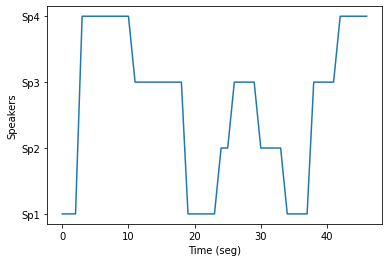

In [82]:
t = np.arange(0,47)
sp = np.zeros(47)

sp[0:3] = sp[19:24] = sp[34:38] = 1
sp[24:26] = sp[30:34] = 2
sp[11:19] = sp[26:30] = sp[38:42] = 3
sp[3:11] = sp[42:47] = 4

plt.ylabel('Speakers')
plt.yticks([0,1,2,3,4], ['', 'Sp1', 'Sp2', 'Sp3', 'Sp4'])
plt.xlabel('Time (seg)')
plt.plot(t, sp)

Para realizar la comprobación se segmentara el audio de test en el ventaneo establecido en el modelo y se iran guardando posibles oradores en un cluster con el cual se harán las comparaciónes en la ventana actual y las ventanas almacenadas en el cluster. Como la red me devuelve un valor númerico que repesenta la similitud entre los dos segmentos del orador hay que establecer un trashold para determinar cuando dos segementos de audio son el mismo orador y cuando son distintos. 

In [41]:
def features(audio, win, fs, mels, fmax):
    S = librosa.feature.melspectrogram(y=audio, sr=fs, n_mels=mels, fmax=fmax)
    S_dB = librosa.power_to_db(S, ref=np.max)
          
    return S_dB

def compare_speakers(model, current_feature, bank_speakers, threshold):
    current_feature = current_feature[np.newaxis,:,:,np.newaxis]
    
    for speaker in bank_speakers.keys():
        feature_compare = bank_speakers[speaker]
        feature_compare = feature_compare[np.newaxis,:,:,np.newaxis]
        
        value = model.predict([current_feature, feature_compare])
        
        if value[0] > threshold:  #Devuelve el primer ordaro que supera el umbral no el mayor
            return speaker
    
    return 'New Speaker'

def test(audio_test_path, win, modelo, threshold):
    audio_test, fs = librosa.load(audio_test_path)
    old_features = features(audio_test[0: int(win * fs)], 3, fs, 128, 6000)

    speakers_feature = {'Sp1': old_features}
    speakers_time = {'Sp1': [[0,win]]}
    current_spk = 'Sp1'
    
    n = len(audio_test)//(win * fs)
    
    for i in range(1, int(n - 1)):
        new_cluster = audio_test[int(i * win * fs): int(i* win * fs + win * fs)]
        new_features = features(new_cluster, 3, fs, 128, 6000)

        result = compare_speakers(modelo, new_features, speakers_feature, threshold)
        
        time_segment_start = np.round(i * win, 2)
        time_segment_end = np.round(i * win + win, 2)
        
        if result == current_spk:  #Son el mismo orador
            current_spk = result
            speakers_feature[current_spk] = new_features  #Se podrían promediar las features si son el mismo
            speakers_time[current_spk].append([time_segment_start, time_segment_end])
            
            continue
            
        if result in speakers_feature.keys():  #Distinto orador pero ya registrado
            current_spk = result
            speakers_feature[current_spk] = new_features
            speakers_time[current_spk].append([time_segment_start, time_segment_end])
        
        else:  #Orador no registrado
            num_speakers = len(speakers_feature.keys())
            current_spk = 'Sp' + str(num_speakers + 1)
            speakers_feature[current_spk] = new_features
            speakers_time[current_spk] = [[time_segment_start, time_segment_end]]
            
    return speakers_feature, speakers_time

In [166]:
path_test = "Data/test.wav"
path_model = "Models/modelo_final.h5"
path_model = "Models/Win3_ep10.h5"
#last_model = load_model(path_model)
#last_model = Model.load_weights(path_model)
win = 2.95
threshold = 0.5

s_features, s_time = test(path_test, win, model_orig, threshold)

New Speaker
New Speaker
New Speaker
Sp1
Sp1
Sp1
Sp1
Sp1
Sp1
Sp1
Sp1
Sp1
Sp1


In [167]:
s_features.keys()

dict_keys(['Sp1', 'Sp2', 'Sp3', 'Sp4'])

In [168]:
s_time

{'Sp1': [[0, 2.95]],
 'Sp2': [[2, 5]],
 'Sp3': [[5, 8]],
 'Sp4': [[8, 11],
  [11, 14],
  [14, 17],
  [17, 20],
  [20, 23],
  [23, 26],
  [26, 29],
  [29, 32],
  [32, 35],
  [35, 38],
  [38, 41]]}

Otro test variando los parametros del modelo.

In [42]:
path_test = "Data/test.wav"
#path_model = "Models/modelo_final.h5"
path_model = "Models/modelo_kernel_final.h5"
#last_model = load_model(path_model)
#last_model = Model.load_weights(path_model)
win = 2.95
threshold = 0.5
model_orig.load_weights("Models/Win1_kernel_ep10.h5")

s_features, s_time = test(path_test, win, model_orig, threshold)

In [43]:
s_features.keys()

dict_keys(['Sp1', 'Sp2', 'Sp3'])

In [44]:
s_time

{'Sp1': [[0, 2.95],
  [2.95, 5.9],
  [5.9, 8.85],
  [11.8, 14.75],
  [14.75, 17.7],
  [20.65, 23.6],
  [23.6, 26.55],
  [26.55, 29.5],
  [29.5, 32.45],
  [32.45, 35.4],
  [35.4, 38.35]],
 'Sp2': [[8.85, 11.8], [17.7, 20.65]],
 'Sp3': [[38.35, 41.3]]}

Se entrenaron dos modelos variando parametros como el lerning rate o el tamaño de la ventana del kernel y en ambos casos el modelo tiene converguer a identificar un solo ordar, por lo cual consideramos que la variedad de datos o el modelo utilizado no son correctos o lo suficientemente diversos como para poder identificar con precisión los oradores; y como el modelo analiza el audio de forma secuencial, el error se arrastra llegando a los resultados difusos presentados en este notebook.